TODO
+ mirar lift
+ mirar posterior vs prior
+ mirar capa anterior a softmax
+ cambiar std de prior por grupo de parámetros
+ mirar que pasa con posterior vs prior cuando std es muy pequaña 
+ probar con modelo de regresión 

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

from fastai2.tabular.all import *
import sys
sys.path.append("../../SpikePy")
import SpikePy as sp
from pandas_profiling import ProfileReport
from decimal import Decimal
from bayes_opt import BayesianOptimization
from torch.nn.functional import softmax, log_softmax
import torch
import seaborn as sn
from sklearn.metrics import roc_auc_score
from tqdm import tqdm_notebook as tqdm

import pyro
import pyro.distributions as dist
from pyro import poutine

from pyro.contrib.autoguide import AutoDiagonalNormal
from pyro.infer import SVI, Trace_ELBO, TracePredictive
from pyro.optim import Adam
from pyro.infer import EmpiricalMarginal

from pyro.infer import Predictive

 Algunas referencias
 + https://forums.fast.ai/t/fastai-v2-tabular/53530/107?u=milo_iturra
 + https://towardsdatascience.com/making-your-neural-network-say-i-dont-know-bayesian-nns-using-pyro-and-pytorch-b1c24e6ab8cd

# Load Data

In [4]:
df = pd.read_csv('../data/winequality-red.csv')
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [5]:
numeric = [c for c in df.columns if c != 'quality']
categs = []
target = 'quality'
df[target] = df[target].astype('float')

In [6]:
ProfileReport(df)

# Distribution of features by class

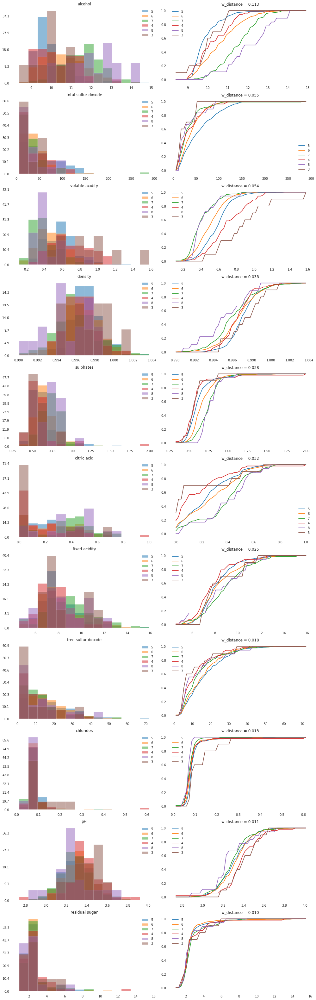

In [7]:
sp.compare_cont_dists([df], numeric, groupby=target, nbins=15); 

# Partial dependence plots

## Numerical variables

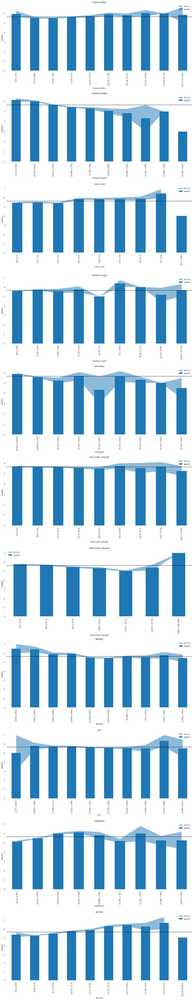

In [9]:
sp.pdplot(df, numeric, target, numeric=True, target_type='regression', nbins=10); 

# Models

In [6]:
def train_model(layer_0, layer_1):
#Trains a tabular model model with 2 layers of sizes layer_0 and layer_1 and returns its accuracy
    n_epochs = 6    
    learn = tabular_learner(dls, layers=[int(layer_0), int(layer_1)])
    with learn.no_logging():
        lr = learn.lr_find(show_plot=False)[0]
        learn.fit_one_cycle(n_epochs, lr)
    preds, targs = learn.get_preds()
    preds_raw = torch.log(preds/(1-preds)) # inverse_of_sigmoid
    return accuracy(preds_raw, targs).numpy()

def get_predictions(df, learn):
    df_dls = learn.dls.valid_ds.new(df)
    df_dls.process()
    df_dls.conts = df_dls.conts.astype(np.float32)
    dl = learn.dls.valid.new(df_dls)
    #################################################################################
    pred, actual = learn.get_preds(dl=dl, with_input=False, with_decoded=False)
    results = pd.DataFrame(columns=['prediction'], index=range(len(pred)))
    results.loc[:, ['prediction']] = pred.numpy()
    return results

In [7]:
procs = [FillMissing, Normalize]

We use 10% of the data for the validation set

In [8]:
valid_pct = .1 

np.random.seed(1313)
valid_idx = np.random.choice(range(len(df)), int(valid_pct*len(df)), replace=False)
train_idx = [x for x in range(len(df)) if x not in valid_idx]

df.loc[valid_idx, 'is_valid'] = 1
df.loc[train_idx, 'is_valid'] = 0

splits = (list(train_idx),list(valid_idx))
print(len(train_idx), len(valid_idx))

1440 159


## Neural Network

In [9]:
tabular_df = TabularPandas(df, procs, categs, numeric, y_names=target, splits=splits)
#Entender bien que chucha esto
dls = tabular_df.dataloaders(100)

### Model definition

In [10]:
use_bayes_opt = False

if use_bayes_opt:
    bounds = {'layer_0': (100, 1000), 'layer_1': (100, 1000)}

    optimizer = BayesianOptimization(
        f=train_model,
        pbounds=bounds,
        random_state=1313,
    )
    optimizer.maximize(init_points=10, n_iter=20)
    
    max_params = optimizer.max['params']
    layer_0, layer_1 = int(max_params['layer_0']), int(max_params['layer_1'])
    
else:
    layer_0, layer_1 = 500, 250
    
layer_0, layer_1

(500, 250)

In [11]:
#probar hacer bayes search con los layers
learn = tabular_learner(dls, layers=[layer_0, layer_1], n_out=1, y_range=(2.9, 8.1),
                        loss_func=F.mse_loss, cbs=[ShowGraphCallback], metrics=[mae])
learn.summary()

TabularModel (Input shape: ['100 x 0', '100 x 11'])
Layer (type)         Output Shape         Param #    Trainable 
BatchNorm1d          100 x 11             22         True      
________________________________________________________________
BatchNorm1d          100 x 11             22         True      
________________________________________________________________
Linear               100 x 500            5,500      True      
________________________________________________________________
ReLU                 100 x 500            0          False     
________________________________________________________________
BatchNorm1d          100 x 500            1,000      True      
________________________________________________________________
Linear               100 x 250            125,000    True      
________________________________________________________________
ReLU                 100 x 250            0          False     
______________________________________________

### Training

1.91E-03


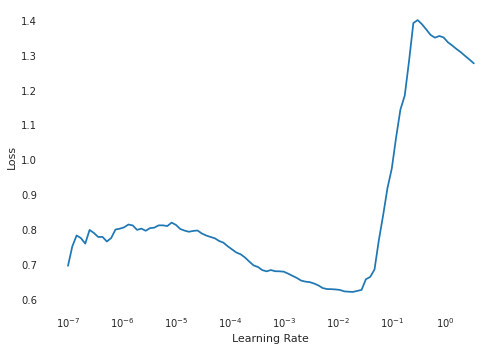

In [12]:
lr = learn.lr_find()[0]
print('%.2E' % Decimal(lr))

epoch,train_loss,valid_loss,mae,time
0,0.584435,0.433342,0.537792,00:00
1,0.507846,0.402747,0.514018,00:00
2,0.471982,0.398865,0.504085,00:00
3,0.436801,0.344957,0.455765,00:00
4,0.404963,0.356867,0.462396,00:00
5,0.376623,0.343054,0.447844,00:00


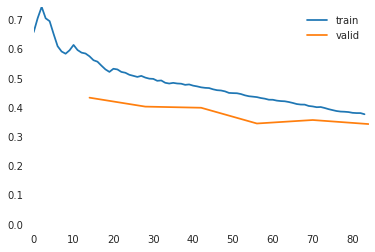

In [13]:
learn.fit_one_cycle(6, lr)

### Mape

In [14]:
results = get_predictions(df, learn)
results.head()

,prediction
0,5.085609
1,5.142844
2,5.382797
3,5.516832
4,5.085609


In [15]:
df['prediction'] = results['prediction'].astype('float32')
df['mae'] = df.eval('100 * abs(prediction - quality)/(0.5 * (prediction + quality))')

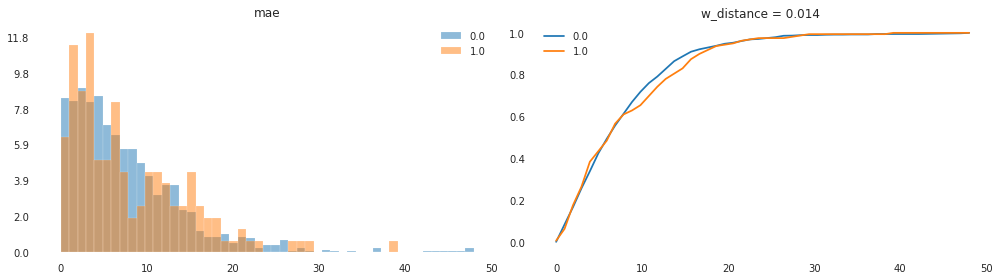

In [16]:
sp.compare_cont_dists([df], ['mae'], groupby='is_valid');

## Bayesian Modeling

In [17]:
def get_predictions_pyro(model, guide, df, n_samples=25, varbls=['_RETURN']):
    
    df_dls = learn.dls.valid_ds.new(df)
    df_dls.process()
    df_dls.conts = df_dls.conts.astype(np.float32)
    dl = learn.dls.valid.new(df_dls)
    x_num = torch.Tensor(dl.dataset.conts.values).to(device, torch.float32)
    x_cat = torch.LongTensor(dl.dataset.cats.values).to(device)
    
    predictive = Predictive(model, guide=guide, num_samples=n_samples, return_sites=varbls)
    samples_post = {v: predictive(x_cat, x_num, None)[v].cpu().detach().numpy() for v in varbls}
    
    return samples_post

### Bayesian NN

#### Model definition 

---------------------------------
Let $F(\cdot | \mathbf{w})$ be the neural network architecture define above with weight parameters $\mathbf{w}$ i.e. $F(x| \mathbf{w})$ is the prediction of quality of wine $x$. Now let $w^*$ be the weights found by the training process using fastai. We define our bayesian model for the wine quality $y$ with these equations:


$$\begin{align*}  y &\sim \text{Normal}(F(x | \mathbf{w}), \sigma^2) \\
\mathbf{w} &\sim \text{Normal}(w^*, \lambda^2) \\
\sigma &\sim \text{Uniform}(0, 10)
\end{align*} 
$$


We extract tensors of numerical and categorical variables on the training set

In [18]:
device = learn.dl.device

x_num_train = torch.Tensor(learn.dls.dataset.conts.values).to(device, torch.float32)
x_cat_train = torch.LongTensor(learn.dls.dataset.cats.values).to(device)
y_train = torch.Tensor(learn.dls.dataset.y.values).to(device)
x_num_train, x_cat_train, y_train

(tensor([[-0.5231,  0.9723, -1.3855,  ...,  1.2940, -0.5821, -0.9616],
         [-0.2935,  1.9767, -1.3855,  ..., -0.7271,  0.1312, -0.5862],
         [-0.2935,  1.3071, -1.1808,  ..., -0.3359, -0.0471, -0.5862],
         ...,
         [-1.1546, -0.0880, -0.7202,  ...,  0.7072,  0.5473,  0.5401],
         [-1.3842,  0.6653, -0.7714,  ...,  1.6852,  0.3095, -0.2108],
         [-1.3268, -1.2041,  1.0197,  ...,  0.5117,  0.0123,  0.5401]],
        device='cuda:0'),
 tensor([], device='cuda:0', size=(1440, 0), dtype=torch.int64),
 tensor([5., 5., 5.,  ..., 6., 5., 6.], device='cuda:0'))

In [19]:
learn.model(x_cat_train, x_num_train).shape

torch.Size([1440, 1])

In [20]:
one = torch.ones(1).to(device)
zero = torch.ones(1).to(device)

In [63]:
batch_size = 1000
scale = 0.01

fastai_centered = True

#original
def model(x_cat, x_num, y=None):
    
    #define priors
    priors = {}
    for name, values in learn.model.named_parameters():
        if fastai_centered:
            loc = values
        else:
            loc = torch.zeros_like(values)
            
        priors[name] = dist.Normal(loc=loc, 
                                   scale=scale*torch.ones_like(values))
        
    
    lifted_module = pyro.random_module("module", learn.model, priors)
    lifted_module_sample = lifted_module()
    
    preds = lifted_module_sample(x_cat, x_num).squeeze()
    sigma = pyro.sample('sigma', dist.Uniform(zero, 10*one))
    
    #likelihood:
    if y is not None:
        with pyro.plate('observe_data', size=len(y), subsample_size=batch_size, device=device) as ind:
            pyro.sample('obs', dist.Normal(preds.index_select(0, ind), sigma), 
                        obs=y.index_select(0, ind))
    
    return preds

Every time we execute the following cell we are sampling from our prior distribution

In [64]:
model(x_cat_train, x_num_train, y_train)

tensor([5.1349, 5.0311, 5.4099,  ..., 6.1730, 5.2209, 5.9399], device='cuda:0',
       grad_fn=<SqueezeBackward0>)

Lets see the distribution of this prior 

In [65]:
y_numpy = y_train.cpu().detach().numpy().astype('int')
y_df = pd.DataFrame({'y': y_numpy, 'wine_id': range(len(y_numpy))})
nn_result = learn.model(x_cat_train, x_num_train).cpu().detach().numpy().flatten()
nn_result_df = pd.DataFrame({'nn_prob': nn_result, 'wine_id': range(len(nn_result))})

In [66]:
n_samples = 100

samples = np.array([model(x_cat_train, x_num_train, y_train).cpu().detach().numpy().flatten() for _ in range(n_samples)])
samples = pd.DataFrame(samples.T)

samples = (samples.stack().to_frame('pred')
                          .reset_index()
                          .rename(columns={'level_0': 'wine_id', 'level_1': 'sample_number'}))
samples = pd.merge(samples, nn_result_df, how='left', on=['wine_id'])
samples = pd.merge(samples, y_df, how='left', on=['wine_id'])
samples['sampled_from'] = 'prior'
samples.head()

,wine_id,sample_number,pred,nn_prob,y,sampled_from
0,0,0,4.930511,5.085609,5,prior
1,0,1,5.118774,5.085609,5,prior
2,0,2,5.113931,5.085609,5,prior
3,0,3,4.973938,5.085609,5,prior
4,0,4,5.057701,5.085609,5,prior


We plot de prior distribution of $P(x|\mathbf{w})$ for two randomly choosen $x$, one for class 1 and one for class 0

In [67]:
def show_prior(samples):
    wine_id = np.random.choice(samples.wine_id.unique())
    preds = samples.query(f'wine_id == {wine_id}')
    fig, axes, _ = sp.compare_cont_dists([preds], ['pred'], nbins=15)
    axes[0][0].set_xlim(3, 8)
    axes[0][0].vlines(preds.nn_prob.unique(), 0 , 5)

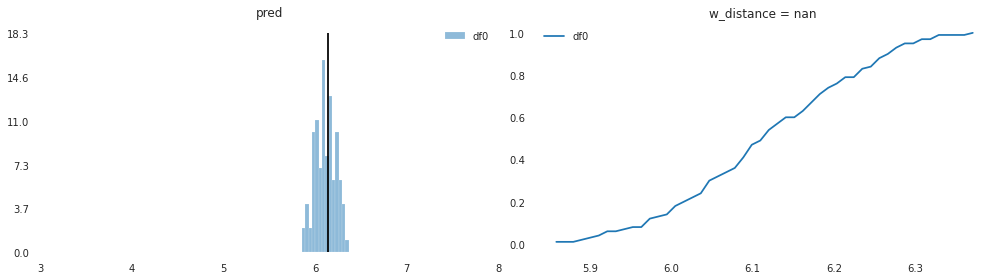

In [68]:
show_prior(samples)

#### Training

In [69]:
guide = AutoDiagonalNormal(model)

In [70]:
optim = Adam({"lr": 0.03})
svi = SVI(model, guide, optim, loss=Trace_ELBO(), num_samples=1000)

/home/ubuntu/miniconda3/envs/spike_basicoV6/lib/python3.6/site-packages/pyro/infer/svi.py:53: FutureWarning: The `num_samples` argument to SVI is deprecated and will be removed in a future release. Use `pyro.infer.Predictive` class to draw samples from the posterior.
  'samples from the posterior.', FutureWarning)


In [71]:
pyro.clear_param_store()
num_iterations = 1000
loss_list = []

for j in range(num_iterations):
    # calculate the loss and take a gradient step
    loss = svi.step(x_cat_train, x_num_train, y_train)
    loss_list += [loss]
    if j % 100 == 0:
        print("[iteration %04d] loss: %.4f" % (j + 1, loss))

/home/ubuntu/miniconda3/envs/spike_basicoV6/lib/python3.6/site-packages/pyro/primitives.py:406: FutureWarning: The `random_module` primitive is deprecated, and will be removed in a future release. Use `pyro.nn.Module` to create Bayesian modules from `torch.nn.Module` instances.
  "modules from `torch.nn.Module` instances.", FutureWarning)


[iteration 0001] loss: 6209525.5081
[iteration 0101] loss: 726820.7499
[iteration 0201] loss: 279293.9408
[iteration 0301] loss: 153042.2142
[iteration 0401] loss: 100704.8629
[iteration 0501] loss: 77324.1536
[iteration 0601] loss: 63985.5493
[iteration 0701] loss: 57734.1106
[iteration 0801] loss: 54082.1434
[iteration 0901] loss: 52382.4735


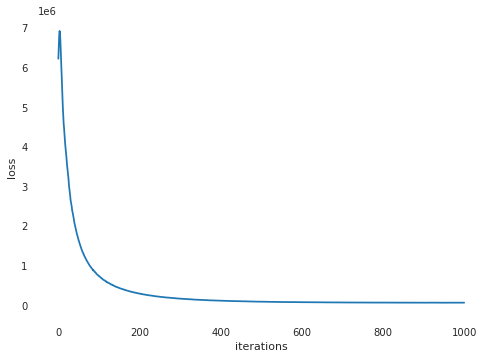

In [72]:
iter_min = 0
plt.plot(np.array(loss_list[iter_min:]))
plt.xlabel('iterations')
plt.ylabel('loss');

#### Predict

We sample from the posterior distribution of $P(x|\mathbf{w})$

In [73]:
df_valid = df.query('is_valid==0').copy()
valid_post = get_predictions_pyro(model, guide, df_valid, n_samples=100)['_RETURN']

/home/ubuntu/miniconda3/envs/spike_basicoV6/lib/python3.6/site-packages/pyro/primitives.py:406: FutureWarning: The `random_module` primitive is deprecated, and will be removed in a future release. Use `pyro.nn.Module` to create Bayesian modules from `torch.nn.Module` instances.
  "modules from `torch.nn.Module` instances.", FutureWarning)


In [74]:
df_valid['mean_prob_post'] = valid_post.mean(axis=0)

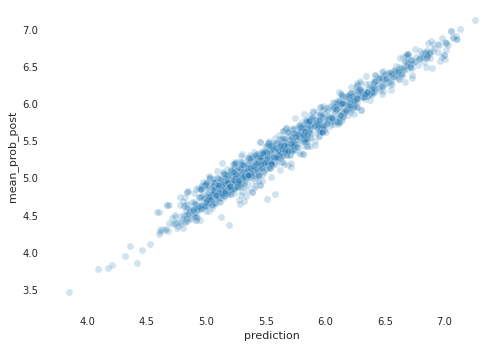

In [75]:
sn.scatterplot(x='prediction', y='mean_prob_post', data=df_valid, alpha=0.2)

In [76]:
samples_post = pd.DataFrame(valid_post.squeeze().T)

samples_post = (samples_post.stack().to_frame('pred')
                          .reset_index()
                          .rename(columns={'level_0': 'wine_id', 'level_1': 'sample_number'}))
samples_post = pd.merge(samples_post, nn_result_df, how='left', on=['wine_id'])
samples_post = pd.merge(samples_post, y_df, how='left', on=['wine_id'])
samples_post['sampled_from'] = 'posterior'
samples_post.head()

,wine_id,sample_number,pred,nn_prob,y,sampled_from
0,0,0,4.666065,5.085609,5,posterior
1,0,1,4.558671,5.085609,5,posterior
2,0,2,4.734515,5.085609,5,posterior
3,0,3,4.901295,5.085609,5,posterior
4,0,4,4.614262,5.085609,5,posterior


In [77]:
samples_pp = pd.concat([samples, samples_post])

In [78]:
def show_prior_and_post(samples):
    wine_id = np.random.choice(samples.wine_id.unique())
    preds = samples.query(f'wine_id == {wine_id}')
    fig, axes, _ = sp.compare_cont_dists([preds], ['pred'], groupby='sampled_from', 
                                         nbins=15)
    axes[0][0].set_xlim(3, 8)
    axes[0][0].vlines(preds.nn_prob.unique(), 0 , 5)

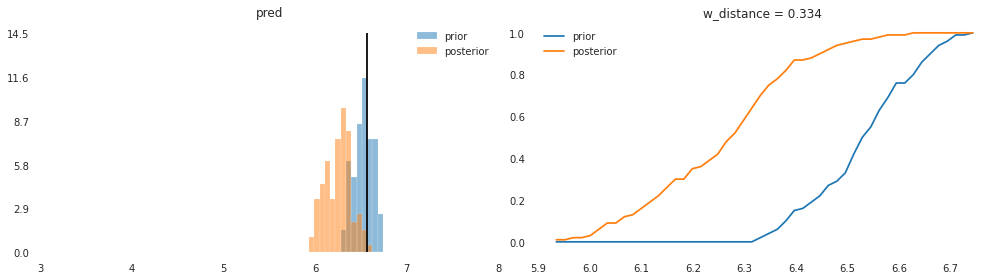

In [86]:
show_prior_and_post(samples_pp)